<div style="border-radius:10px; padding: 15px; background-color: #FFBB70; font-size:120%; text-align:left">

<h3 align="left"><font color=BLACK>Project Description</font></h3>
In a work environment, Employee Attrition describes an unanticipated attrition of the workforce. The causes of this decline are all unavoidable reasons such as retirement, resignation, employee loss of work capacity or sudden death. Companies with high workforce attrition rates often face the risk of abusing internal resources.

<h3 align="left"><font color=BLACK>Problem Statement</font></h3>    

- Discover the factors that affect employee attrition and take measures to reduce this rate.

- Develop a machine learning model that accurately predicts whether an employee is likely to leave the company (attrition) based on various features related to their demographics, job satisfaction, work environment, and other relevant factors

---
# Attrition in an Organization || Why Workers Quit?

---

Employees are the backbone of the organization. Organization's performance is heavily based on the quality of the employees. Challenges that an organization has to face due employee attrition are:

> 1. Expensive in terms of both money and time to train new employees.
> 1. Loss of experienced employees
> 1. Impact in productivity
> 1. Impact profit

Before getting our hands dirty with the data, first step is to frame the business question. Having clarity on below questions is very crucial because the solution that is being developed will make sense only if we have well stated problem.

------
## Business questions to brainstorm:
---
> 1. What factors are contributing more to employee attrition?
> 1. What type of measures should the company take in order to retain their employees?
> 1. What business value does the model bring?
> 1. Will the model save lots of money?
> 1. Which business unit faces the attrition problem?

### Meaning of classifications-
**Education:** 1 'Below College' 2 'College' 3 'Bachelor' 4 'Master' 5 'Doctor'

**EnvironmentSatisfaction:** 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

**JobInvolvement:** 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

**JobSatisfaction:** 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

**PerformanceRating:** 1 'Low' 2 'Good' 3 'Excellent' 4 'Outstanding'

**RelationshipSatisfaction:** 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

**WorkLifeBalance:** 1 'Bad' 2 'Good' 3 'Better' 4 'Best

### Importing Libraries

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import hvplot.pandas

from warnings import filterwarnings
filterwarnings('ignore')


pd.options.display.max_columns = None
pd.options.display.max_rows = None
     
pd.options.display.float_format = '{:.6f}'.format

from sklearn.model_selection import train_test_split

import statsmodels
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler 

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import tree
from sklearn.model_selection import GridSearchCV

import pydotplus
from sklearn.tree import export_graphviz
from IPython.display import Image 

### Loading Dataset

In [2]:
df=pd.read_csv('HR_DATASET.csv')

In [3]:
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [4]:
df.shape

(917, 35)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 917 entries, 0 to 916
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       917 non-null    int64 
 1   Attrition                 917 non-null    object
 2   BusinessTravel            917 non-null    object
 3   DailyRate                 917 non-null    int64 
 4   Department                917 non-null    object
 5   DistanceFromHome          917 non-null    int64 
 6   Education                 917 non-null    int64 
 7   EducationField            917 non-null    object
 8   EmployeeCount             917 non-null    int64 
 9   EmployeeNumber            917 non-null    int64 
 10  EnvironmentSatisfaction   917 non-null    int64 
 11  Gender                    917 non-null    object
 12  HourlyRate                917 non-null    int64 
 13  JobInvolvement            917 non-null    int64 
 14  JobLevel                  

In [6]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [7]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000,917.000000
mean,36.938931,785.711014,9.294438,2.921483,1.000000,1413.466739,2.738277,66.231189,2.721919,2.044711,2.688113,6452.293348,14428.468920,2.696838,15.214831,3.149400,2.637950,80.000000,0.821156,11.179935,2.791712,2.760087,6.972737,4.217012,2.147219,4.062159
std,8.984981,401.902148,8.092566,1.020717,0.000000,388.606884,1.103382,20.237536,0.720936,1.100400,1.110097,4685.137761,7188.332799,2.489217,3.640007,0.356677,1.078673,0.000000,0.864555,7.802790,1.292917,0.708047,5.951250,3.588223,3.176250,3.571395
min,18.000000,102.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1051.000000,2097.000000,0.000000,11.000000,3.000000,1.000000,80.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,444.000000,2.000000,2.000000,1.000000,1084.000000,2.000000,49.000000,2.000000,1.000000,2.000000,2933.000000,8018.000000,1.000000,12.000000,3.000000,2.000000,80.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,772.000000,7.000000,3.000000,1.000000,1425.000000,3.000000,66.000000,3.000000,2.000000,3.000000,4877.000000,14255.000000,2.000000,14.000000,3.000000,3.000000,80.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1141.000000,14.000000,4.000000,1.000000,1737.000000,4.000000,84.000000,3.000000,3.000000,4.000000,8103.000000,20763.000000,4.000000,18.000000,3.000000,4.000000,80.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1498.000000,29.000000,5.000000,1.000000,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19973.000000,26997.000000,9.000000,25.000000,4.000000,4.000000,80.000000,3.000000,40.000000,6.000000,4.000000,36.000000,17.000000,15.000000,17.000000


In [8]:
df.describe(include='O').T

,count,unique,top,freq
Attrition,917,2,No,763
BusinessTravel,917,3,Travel_Rarely,648
Department,917,3,Research & Development,597
EducationField,917,6,Life Sciences,385
Gender,917,2,Male,550
JobRole,917,9,Sales Executive,203
MaritalStatus,917,3,Married,436
Over18,917,1,Y,917
OverTime,917,2,No,656


### Understanding target variable

In [9]:
df['Attrition'].value_counts()

Attrition
No     763
Yes    154
Name: count, dtype: int64

In [10]:
file=df.Attrition.value_counts()

In [11]:
file.index

Index(['No', 'Yes'], dtype='object', name='Attrition')

In [12]:
file.values

array([763, 154], dtype=int64)

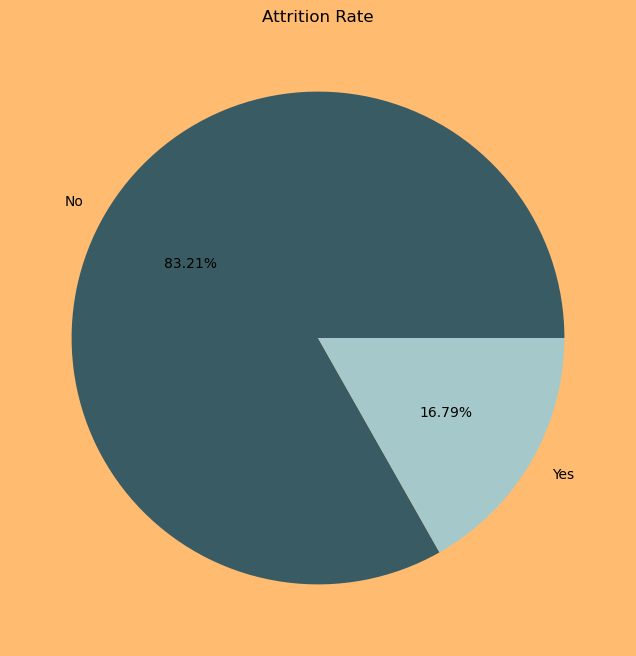

In [13]:
plt.figure(figsize=(8,8), facecolor='#FFBB70')
plt.title('Attrition Rate', color='black')
plt.pie(file,labels=file.index,autopct='%.2f%%',colors=['#395B64','#A5C9CA'])
plt.show()

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

### Insights:
16.79% of employees have left the company

The dataset is not balanced, which might introduce some bias in the predictive model. It would be interesting to proceed to two (2) analyses, one with the imbalanced dataset and one with a dataset balanced using the Synthetic minority Oversampling Technique (SMOTE).

A closer look to the means of the variables allow to highlight the differences between the employees who left the company and those who stayed.

### Understanding Numerical Variables

In [14]:
numeric_df = df.select_dtypes(include=['number'])

# Add the 'Attrition' column back for grouping purposes
numeric_df['Attrition'] = df['Attrition']

# Group by 'Attrition' and calculate the mean for numeric columns
numeric_df.groupby('Attrition').mean()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,,,,,,,,,,,,,,,,,,,,,,,,,,
No,37.470511,794.440367,9.047182,2.930537,1.000000,1425.656619,2.779817,66.200524,2.754915,2.116645,2.747051,6763.136304,14478.108781,2.644823,15.238532,3.148100,2.665793,80.000000,0.867628,11.730013,2.849279,2.785059,7.279161,4.463958,2.162516,4.280472
Yes,34.305195,742.461039,10.519481,2.876623,1.000000,1353.071429,2.532468,66.383117,2.558442,1.688312,2.396104,4912.207792,14182.525974,2.954545,15.097403,3.155844,2.500000,80.000000,0.590909,8.454545,2.506494,2.636364,5.454545,2.993506,2.071429,2.980519


<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">
    
**Age:** Employees who left are younger on average (34.3 years) compared to those who stayed (37.5 years). This suggests younger employees are more likely to leave.

**Daily Rate:** Employees who left have a slightly lower average daily rate (742.46) compared to those who stayed (794.44). This could indicate that pay might be a factor in attrition.

**Distance From Home:** Those who left live farther from their workplace on average (10.52 units) compared to those who stayed (9.05 units). Commute distance might contribute to turnover.

**Education:** There is a minimal difference in the average education level between those who left (2.88) and those who stayed (2.93), indicating education level may not be a significant factor in attrition.

**Environment Satisfaction:** Employees who stayed have a slightly higher environment satisfaction (2.78) than those who left (2.53), suggesting a correlation between work environment satisfaction and retention.

**Job Level:** Higher average job levels are seen in those who stayed (2.12) compared to those who left (1.69), implying higher positions may correlate with lower attrition.

**Job Satisfaction:** Those who stayed have higher job satisfaction (2.75) compared to those who left (2.40), highlighting job satisfaction as a key factor in retention.

**Monthly Income:** Significantly higher for those who stayed (6763.14) compared to those who left (4912.21), indicating income level is a major factor in attrition.

**Total Working Years:** Those who stayed have more working years on average (11.73) compared to those who left (8.45), suggesting more experienced employees are more likely to stay.

**Years at Company:** Employees who stayed have been with the company longer on average (7.28 years) compared to those who left (5.45 years), indicating tenure is a strong factor in retention.

**Years in Current Role:** Longer average duration in the current role for those who stayed (4.46 years) compared to those who left (2.99 years).

**Years Since Last Promotion:** Slightly higher for those who stayed (2.16 years) compared to those who left (2.07 years), indicating recent promotion history might not be a strong differentiator.

**Years with Current Manager:** Employees who stayed have longer average durations with their current manager (4.28 years) compared to those who left (2.98 years), suggesting a stable relationship with managers contributes to lower attrition.

### Missing value Analysis

In [15]:
Total = df.isnull().sum().sort_values(ascending=False)          

Percent = (df.isnull().sum()*100/df.isnull().count()).sort_values(ascending=False)   

missing_data = pd.concat([Total, Percent], axis=1, keys=['Total', 'Percentage of Missing Values'])    
missing_data

,Total,Percentage of Missing Values
Age,0,0.000000
StandardHours,0,0.000000
NumCompaniesWorked,0,0.000000
Over18,0,0.000000
OverTime,0,0.000000
PercentSalaryHike,0,0.000000
PerformanceRating,0,0.000000
RelationshipSatisfaction,0,0.000000
StockOptionLevel,0,0.000000
MonthlyIncome,0,0.000000


<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">
There are no missing values in the dataset

### Removing insignificant features

In [16]:
df.nunique()

Age                          43
Attrition                     2
BusinessTravel                3
DailyRate                   673
Department                    3
DistanceFromHome             29
Education                     5
EducationField                6
EmployeeCount                 1
EmployeeNumber              917
EnvironmentSatisfaction       4
Gender                        2
HourlyRate                   71
JobInvolvement                4
JobLevel                      5
JobRole                       9
JobSatisfaction               4
MaritalStatus                 3
MonthlyIncome               865
MonthlyRate                 899
NumCompaniesWorked           10
Over18                        1
OverTime                      2
PercentSalaryHike            15
PerformanceRating             2
RelationshipSatisfaction      4
StandardHours                 1
StockOptionLevel              4
TotalWorkingYears            39
TrainingTimesLastYear         7
WorkLifeBalance               4
YearsAtC

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">
Since EmployeeNumber have all unique values so we'll drop it as it won't contribute much in our analysis. 

In [17]:
df.drop(["EmployeeNumber"], axis = 1, inplace=True)

In [18]:
df.Over18.value_counts()

Over18
Y    917
Name: count, dtype: int64

In [19]:
df.StandardHours.value_counts()

StandardHours
80    917
Name: count, dtype: int64

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">
Since Over18, StandardHours, EmployeeCount have only one value following in whole column, so we'll drop them from our analysis as they won't be of any use to use in prediction Attrition.

In [20]:
df.drop(['Over18','StandardHours','EmployeeCount'], axis = 1, inplace=True)

In [21]:
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StockOptionLevel             int64
TotalWorkingYears            int64
TrainingTimesLastYear        int64
WorkLifeBalance              int64
YearsAtCompany               int64
YearsInCurrentRole  

### Visualization for Numerical Features

In [22]:
disc_col = []
for column in df.columns:
    if df[column].dtypes != object and df[column].nunique() < 30:
        print(f"{column} : {df[column].unique()}")
        disc_col.append(column)
        print("====================================")


DistanceFromHome : [ 1  8  2  3 24 26 10 27 19  6  9 11  7 16 23 13  4 29 12 14  5 25 21 18
 20 17 22 28 15]
Education : [2 1 4 5 3]
EnvironmentSatisfaction : [2 3 4 1]
JobInvolvement : [3 2 1 4]
JobLevel : [2 1 4 5 3]
JobSatisfaction : [4 2 3 1]
NumCompaniesWorked : [8 1 6 9 3 0 4 5 2 7]
PercentSalaryHike : [11 23 15 12 13 14 18 22 17 16 19 21 24 20 25]
PerformanceRating : [3 4]
RelationshipSatisfaction : [1 4 2 3]
StockOptionLevel : [0 1 2 3]
TrainingTimesLastYear : [0 3 2 5 1 4 6]
WorkLifeBalance : [1 3 4 2]
YearsInCurrentRole : [ 4  7  0  2  8  6  9  5  3 14 15 13  1 10 12 16 11 17]
YearsSinceLastPromotion : [ 0  1  3  2  4  7 14 13  6  5  8 11 15 10  9 12]
YearsWithCurrManager : [ 5  7  0  2  1 16  8  4  3  9 12  6 17 11 15 10 13 14]


In [23]:
num_col= df[['Age','DistanceFromHome', 'Education', 'EnvironmentSatisfaction','JobInvolvement','JobLevel','JobSatisfaction', 'NumCompaniesWorked','PercentSalaryHike',  'PerformanceRating', 'RelationshipSatisfaction','StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear','WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion','YearsWithCurrManager']] 


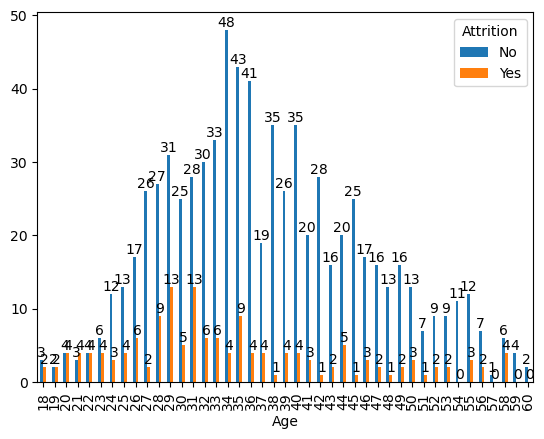

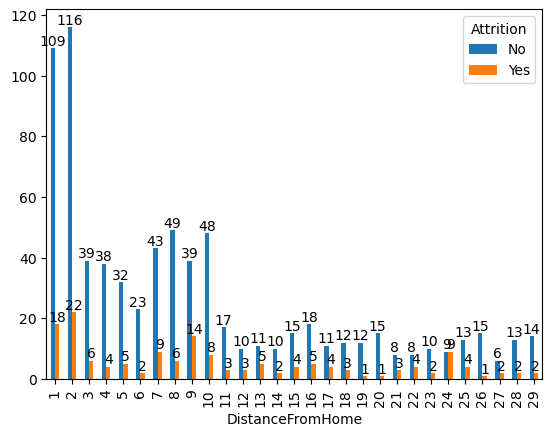

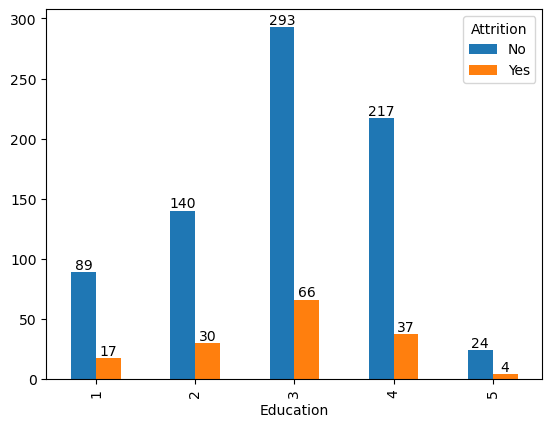

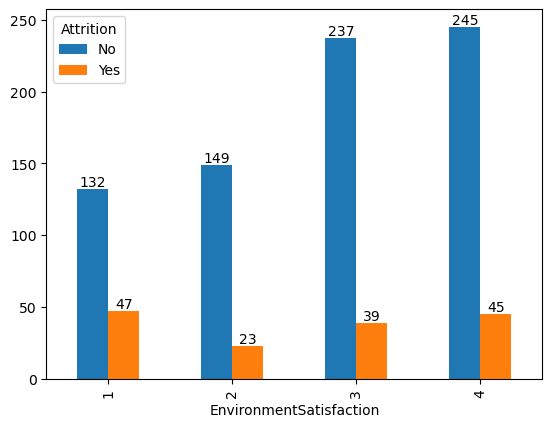

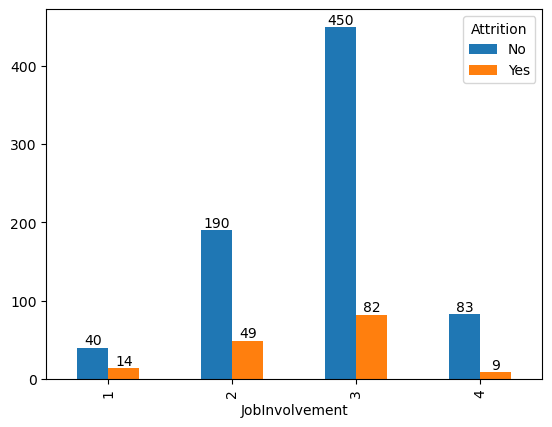

...

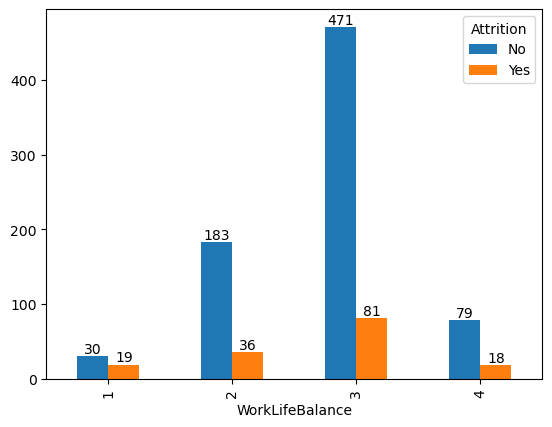

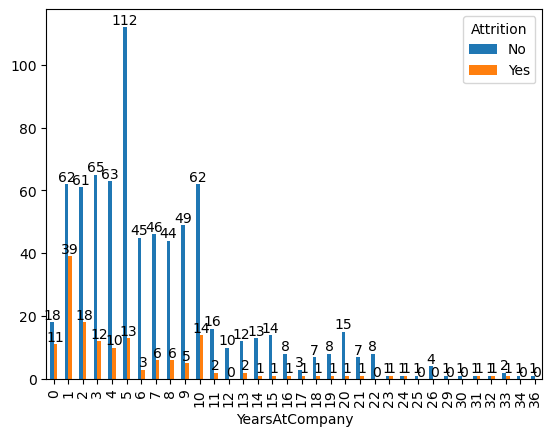

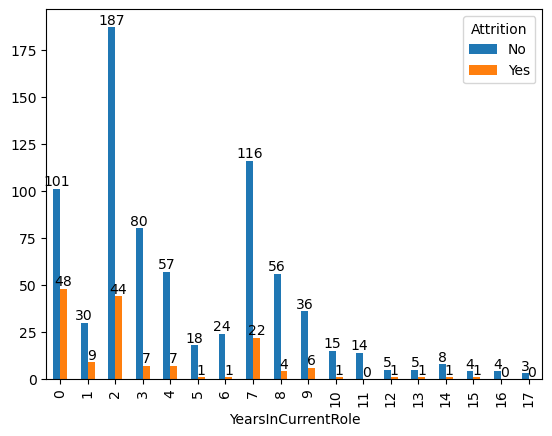

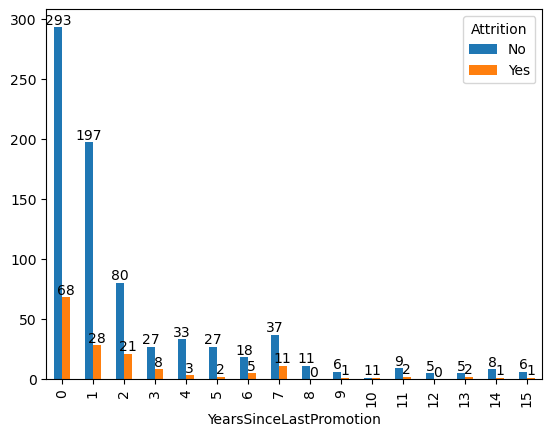

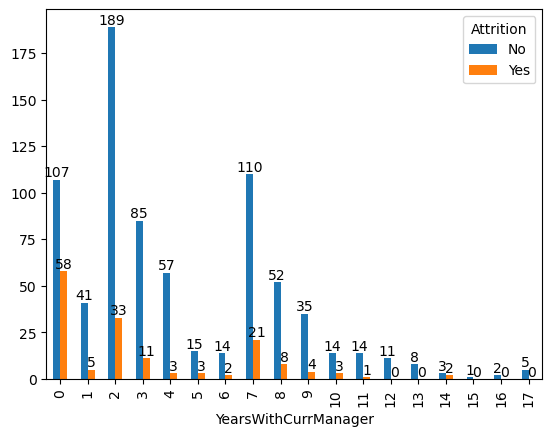

In [24]:
for column in num_col:
    bar=pd.crosstab(num_col[column],df['Attrition']).plot(kind='bar')
    for container in bar.containers:
        plt.bar_label(container)
    

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

### Insights
**Age and Attrition:**
Younger employees have a higher attrition rate than older employees, indicating that younger staff members are more likely to leave the company.

**Educational Background (Education):**
Employees with Bachelor's and Master's degrees are more likely to leave, possibly because they have more opportunities available to them in the job market.

**Work Experience (NumCompaniesWorked):**
Employees who have worked in fewer companies tend to have a higher attrition rate, suggesting that less experienced workers are more likely to leave.

**Salary Increase (PercentSalaryHike):**
Workers with lower percentage salary hikes are more likely to leave, indicating that insufficient salary growth may contribute to higher turnover rates.

**Working Hours (TotalWorkingHours):**
Employees with fewer working hours are quitting more, which could imply that less experienced employees, who often have fewer working hours, are more likely to leave.

**Tenure at Company (YearsAtCompany):**
Employees who have worked fewer than six years at the company are more likely to quit, showing a trend of higher attrition among those with shorter tenures.

**Current Role Duration (YearsInCurrentRole):**
Employees who have been in their current role for less than five years are more likely to quit, suggesting that a shorter duration in the same role is linked to higher attrition.

**Managerial Relationship (YearsWithCurrManager):**
Workers who have spent fewer years with their current manager are more likely to quit, indicating that a stable relationship with a manager might contribute to employee retention.

### Visualization for Categorical Variables

In [25]:
object_col = []
for column in df.columns:
    if df[column].dtype == object and len(df[column].unique()) <= 30:
        object_col.append(column)
        print(f"{column} : {df[column].unique()}")
        print(df[column].value_counts())
        print("====================================")
object_col.remove('Attrition')

Attrition : ['Yes' 'No']
Attrition
No     763
Yes    154
Name: count, dtype: int64
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
BusinessTravel
Travel_Rarely        648
Travel_Frequently    172
Non-Travel            97
Name: count, dtype: int64
Department : ['Sales' 'Research & Development' 'Human Resources']
Department
Research & Development    597
Sales                     275
Human Resources            45
Name: count, dtype: int64
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
EducationField
Life Sciences       385
Medical             285
Marketing            92
Technical Degree     82
Other                55
Human Resources      18
Name: count, dtype: int64
Gender : ['Female' 'Male']
Gender
Male      550
Female    367
Name: count, dtype: int64
JobRole : ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Manager' 'Sales Representative'
 'Healthcare Representative' 'R

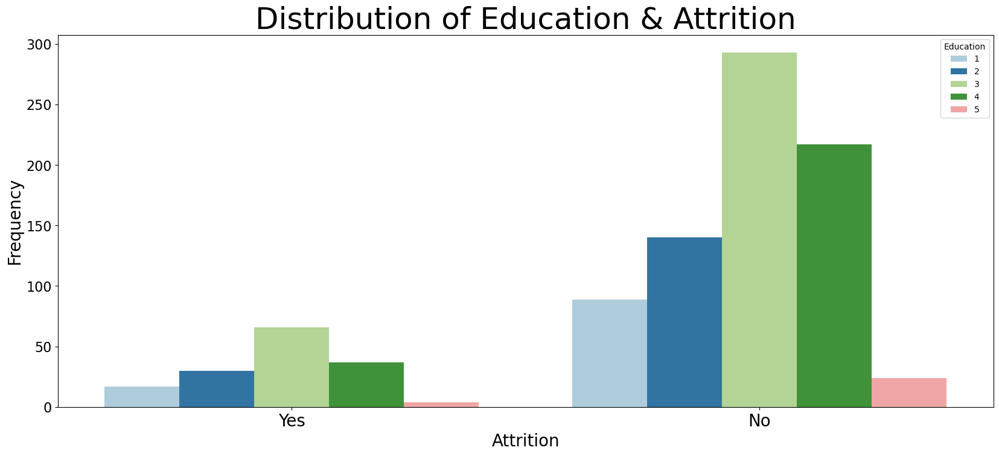

In [26]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'Attrition', hue = 'Education', palette = "Paired")
plt.title('Distribution of Education & Attrition', size = 36)
plt.xlabel("Attrition", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

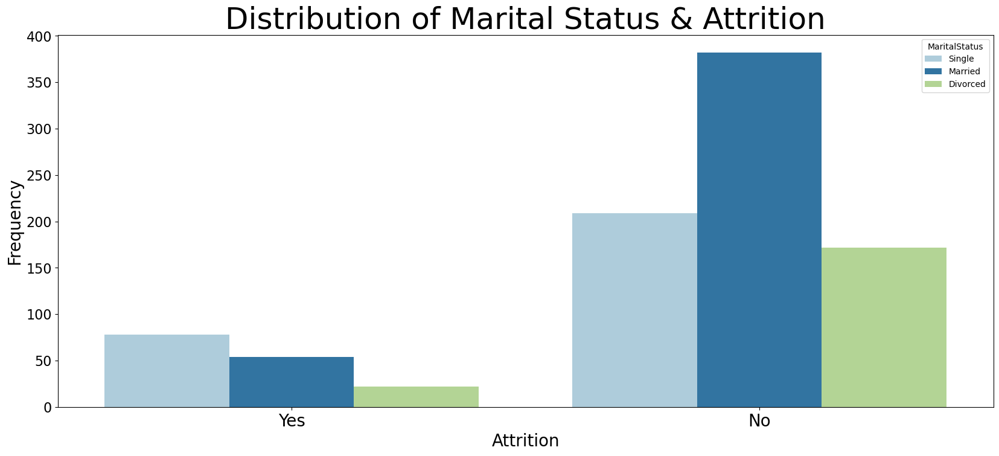

In [27]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'Attrition', hue = 'MaritalStatus', palette = "Paired")
plt.title('Distribution of Marital Status & Attrition', size = 36)
plt.xlabel("Attrition", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

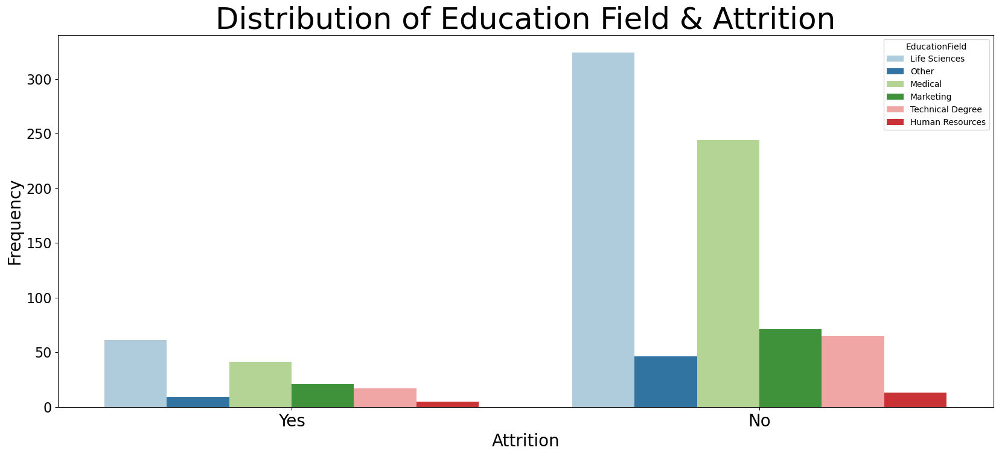

In [28]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'Attrition', hue = 'EducationField', palette = "Paired")
plt.title('Distribution of Education Field & Attrition', size = 36)
plt.xlabel("Attrition", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

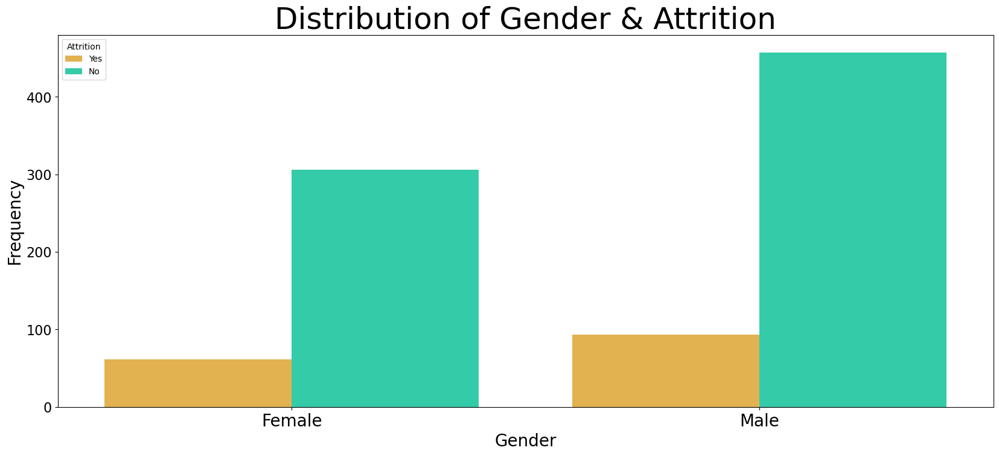

In [29]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'Gender', hue = 'Attrition', palette = "turbo_r")
plt.title('Distribution of Gender & Attrition', size = 36)
plt.xlabel("Gender", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

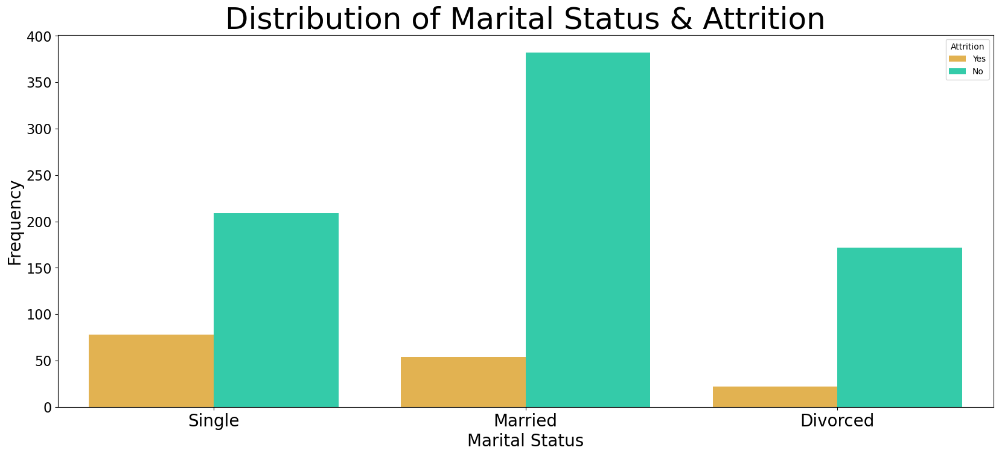

In [30]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'MaritalStatus', hue = 'Attrition', palette = "turbo_r")
plt.title('Distribution of Marital Status & Attrition', size = 36)
plt.xlabel("Marital Status", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

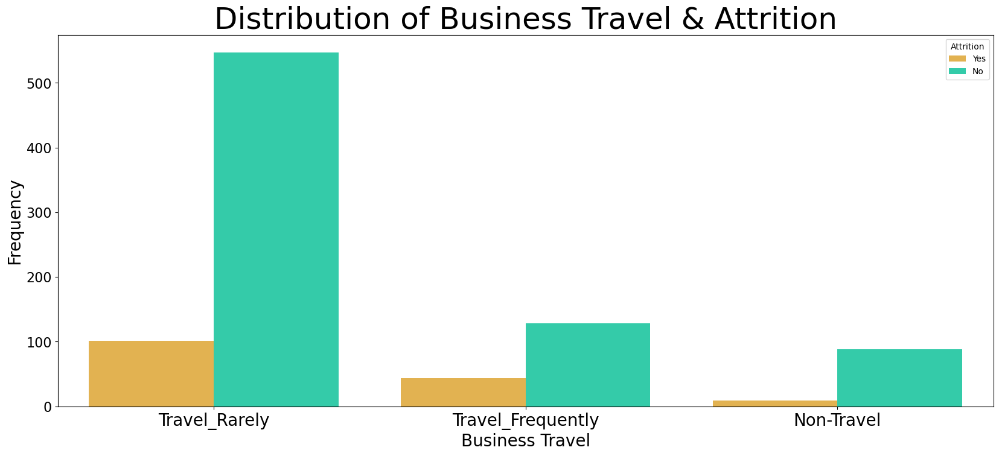

In [31]:
plt.figure(figsize = (20,8))
sns.countplot(data = df, x = 'BusinessTravel', hue = 'Attrition', palette = "turbo_r")
plt.title('Distribution of Business Travel & Attrition', size = 36)
plt.xlabel("Business Travel", size = 20)
plt.ylabel("Frequency", size = 20)
plt.xticks(size = 20);
plt.yticks(size = 16);

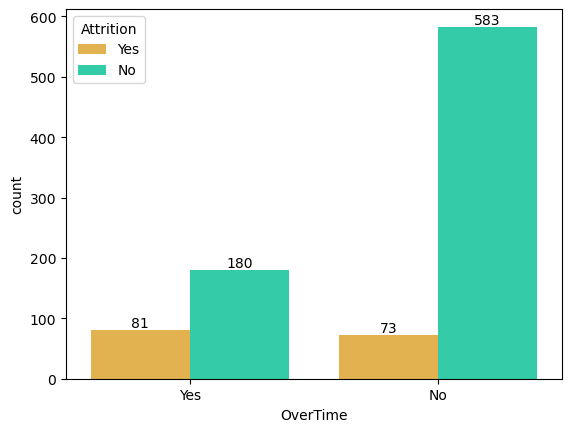

In [32]:
bar=sns.countplot(x='OverTime',data=df,hue='Attrition',palette='turbo_r')
for container in bar.containers:
        plt.bar_label(container)
    

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

### Insights
**Marital Status:**
Single employees have a higher attrition rate compared to married and divorced employees, suggesting that single employees are more likely to leave the company.

**Gender:**
Male employees are more likely to quit than female employees, suggesting a higher attrition rate among male staff.

**Field of Education:**
Employees with educational backgrounds in Life Sciences and Medical fields are quitting more compared to those from other educational fields, indicating higher attrition in these specific fields.

**Business Travel:**
Employees with higher rates of business travel are quitting more, indicating that frequent business travel may be a factor contributing to higher attrition rates.

In [33]:
import hvplot

In [34]:
df.hvplot.hist(y='DistanceFromHome', by='Attrition', subplots=False, width=600, height=300, bins=30)

:NdOverlay   [Attrition]
   :Histogram   [DistanceFromHome]   (DistanceFromHome_count)

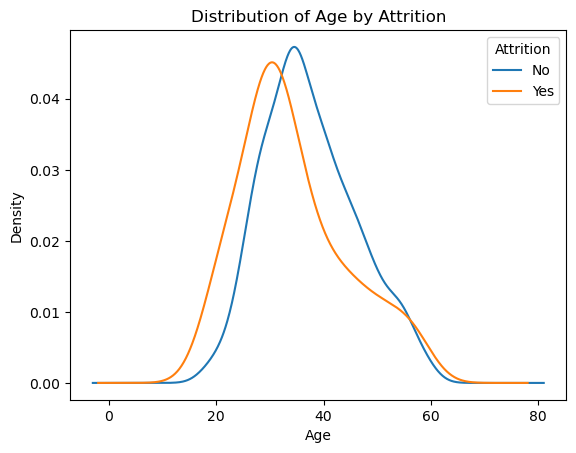

In [35]:
df.groupby('Attrition')['Age'].plot(kind='kde')
plt.title("Distribution of Age by Attrition")
plt.xlabel("Age")
plt.ylabel("Density")

# Show the legend
plt.legend(title="Attrition")
plt.show()

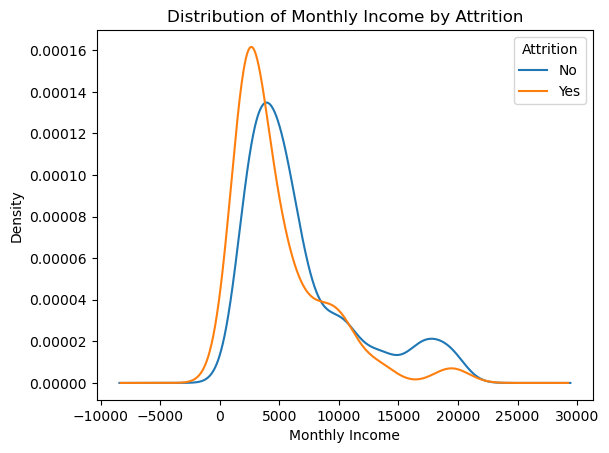

In [36]:
df.groupby('Attrition')['MonthlyIncome'].plot(kind='kde')
plt.title("Distribution of Monthly Income by Attrition")
plt.xlabel("Monthly Income")
plt.ylabel("Density")

# Show the legend
plt.legend(title="Attrition")
plt.show()

<Axes: xlabel='Age', ylabel='MonthlyIncome'>

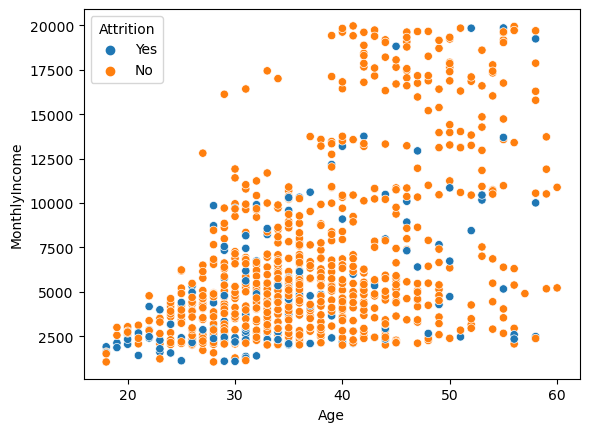

In [37]:
sns.scatterplot(x=df.Age,y=df.MonthlyIncome,hue=df.Attrition)

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

**Young Workers with less MonthlyIncome have higher Attrition rate**

<Axes: xlabel='YearsWithCurrManager', ylabel='Age'>

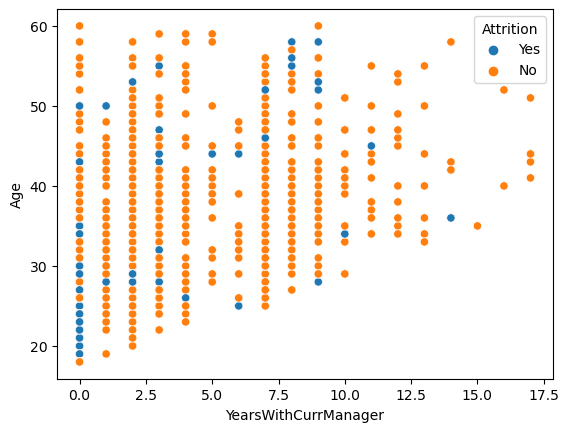

In [38]:
sns.scatterplot(y=df.Age,x=df.YearsWithCurrManager,hue=df.Attrition)

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

**Young Workers who have worked less number of years with current manager are more likely to quit.**

<Axes: xlabel='MonthlyIncome', ylabel='YearsSinceLastPromotion'>

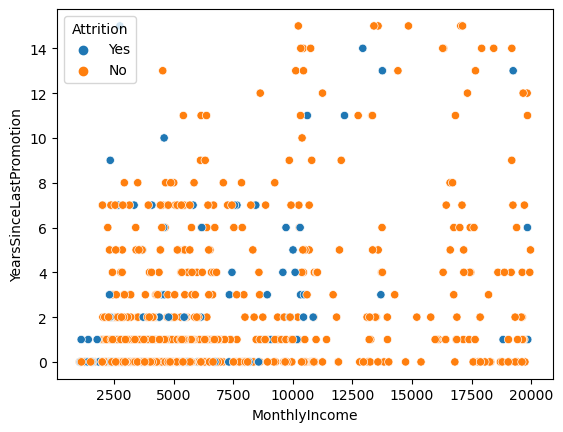

In [39]:
sns.scatterplot(y=df.YearsSinceLastPromotion,x=df.MonthlyIncome,hue=df.Attrition)

<Axes: xlabel='Age', ylabel='YearsInCurrentRole'>

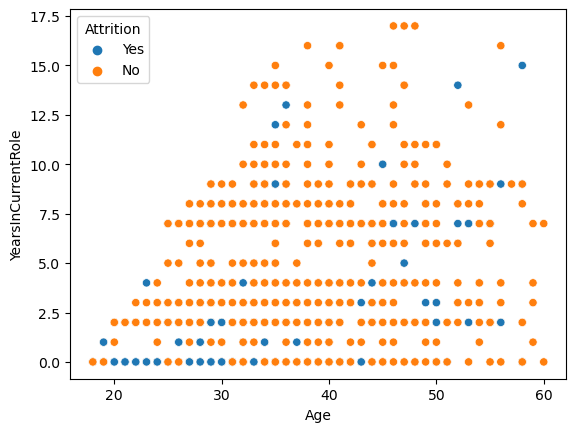

In [40]:
sns.scatterplot(x=df.Age,y=df.YearsInCurrentRole,hue=df.Attrition)

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

**Younger worker who also have worked for less Years in current role they have high attrition rate**

<Axes: xlabel='MonthlyIncome', ylabel='YearsInCurrentRole'>

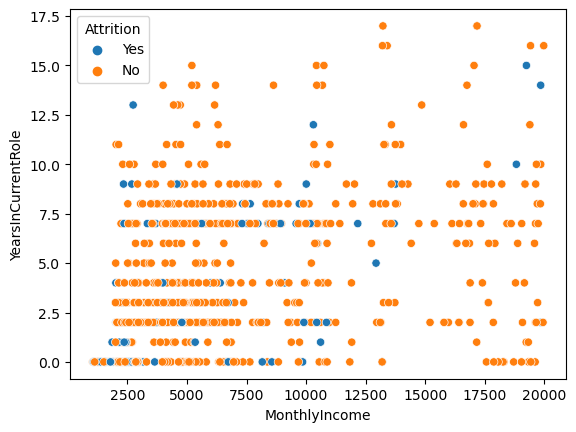

In [41]:
sns.scatterplot(y=df.YearsInCurrentRole,x=df.MonthlyIncome,hue=df.Attrition)

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

### Insights
- The workers with low `JobLevel`, `MonthlyIncome`, `YearAtCompany`, and `TotalWorkingYears` are more likely to quit there jobs.
- `BusinessTravel` : The workers who travel alot are more likely to quit then other employees.

- `EducationField` : The workers with `Life Sciences` and `Medical` are more likely to quit then employees from other fields of educations.

- `Gender` : The `Male` are more likely to quit.

- `MaritalStatus` : The workers who have `Single` marital status are more likely to quit than `Married`, and `Divorced`.

- `OverTime` : The workers who work more hours are likely to quit then others.

<Axes: >

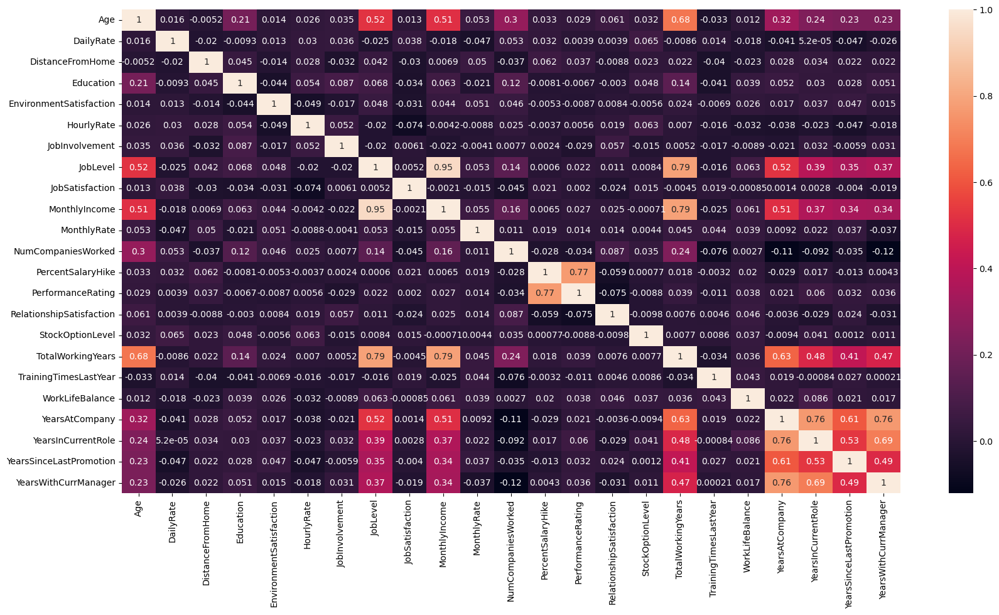

In [42]:
num_col1=df.select_dtypes(exclude='O')
plt.figure(figsize=(20,10))
sns.heatmap(num_col1.corr(),annot=True)

### Defining Target variable

In [26]:
df_target = df['Attrition']

df_feature = df.drop('Attrition', axis = 1)

In [27]:
y = df_target.apply(lambda x: 1 if x == 'Yes' else 0)

### Dummy encode

In [28]:
df_num = df_feature.select_dtypes(include = [np.number])

df_num.columns

Index(['Age', 'DailyRate', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsSinceLastPromotion', 'YearsWithCurrManager'],
      dtype='object')

In [29]:
df_cat = df_feature.select_dtypes(include = [np.object])

df_cat.columns

Index(['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole',
       'MaritalStatus', 'OverTime'],
      dtype='object')

In [30]:
dummy_var = pd.get_dummies(data = df_cat, drop_first = True)

In [31]:
X = pd.concat([df_num, dummy_var], axis = 1)

X.head()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,2,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,False,True,False,True,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True
1,49,279,8,1,3,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,True,False,True,False,True,False,False,False,False,True,False,False,False,False,False,True,False,False,True,False,False
2,37,1373,2,2,4,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,False,True,True,False,False,False,False,True,False,True,False,True,False,False,False,False,False,False,False,True,True
3,33,1392,3,4,4,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,True,False,True,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False,True,False,True
4,27,591,2,1,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,False,True,True,False,False,False,True,False,False,True,False,True,False,False,False,False,False,False,True,False,False


### Train test split

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 10, test_size = 0.3)
print('X_train', X_train.shape)
print('y_train', y_train.shape)

print('X_test', X_test.shape)
print('y_test', y_test.shape)

X_train (641, 44)
y_train (641,)
X_test (276, 44)
y_test (276,)


**Generalized function to calculate the metrics for the train and the test set**

In [33]:
def get_train_report(model):
    train_pred = model.predict(X_train)
    return(classification_report(y_train, train_pred))

In [34]:
def get_test_report(model): 
    test_pred = model.predict(X_test)

    return(classification_report(y_test, test_pred))

### Decision tree classifier

In [77]:
decision_tree_classification = DecisionTreeClassifier(criterion = 'gini', random_state = 10)

decision_tree = decision_tree_classification.fit(X_train, y_train)

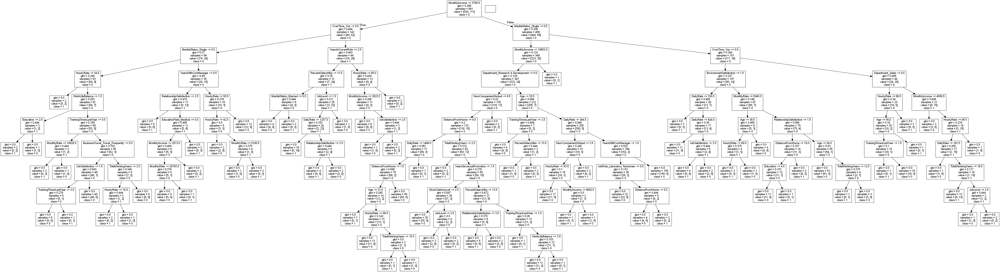

In [78]:
labels = X_train.columns

dot_data = tree.export_graphviz(decision_tree, feature_names = labels, class_names = ["0","1"])  
graph = pydotplus.graph_from_dot_data(dot_data)  

Image(graph.create_png())

### Over-fitting in decision tree

In [79]:
train_report = get_train_report(decision_tree)

print(train_report)

test_report = get_test_report(decision_tree)

print(test_report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       530
           1       1.00      1.00      1.00       111

    accuracy                           1.00       641
   macro avg       1.00      1.00      1.00       641
weighted avg       1.00      1.00      1.00       641

              precision    recall  f1-score   support

           0       0.88      0.85      0.87       233
           1       0.33      0.40      0.36        43

    accuracy                           0.78       276
   macro avg       0.61      0.62      0.62       276
weighted avg       0.80      0.78      0.79       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

22% gap in accuracy between train and test, which means overfitting. If we tune the hyperparameters in the decision tree, it helps to avoid the over-fitting of the tree.

**Built a decision tree using random parameters such as 'criterion = gini', 'max_depth = 3', 'min_samples_split = 5', 'max_leaf_nodes = 6'.**

In [80]:
dt_model = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 3,
                                  min_samples_split = 5,
                                  max_leaf_nodes = 6,
                                  random_state = 10)

decision_tree = dt_model.fit(X_train, y_train)

train_report = get_train_report(decision_tree)
print('Train data:\n', train_report)

test_report = get_test_report(decision_tree)
print('Test data:\n', test_report)

Train data:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       530
           1       0.77      0.22      0.34       111

    accuracy                           0.85       641
   macro avg       0.82      0.60      0.63       641
weighted avg       0.84      0.85      0.82       641

Test data:
               precision    recall  f1-score   support

           0       0.88      0.97      0.92       233
           1       0.65      0.26      0.37        43

    accuracy                           0.86       276
   macro avg       0.76      0.62      0.64       276
weighted avg       0.84      0.86      0.84       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Train accuracy has gone down to 0.85. Whereas test accuracy has actually gone up to 0.86. Earlier the gap between train and test accuracy was 22%. Now that I have tuned some parameters, even though that is also randomly. I have reduced this gap from 22% to 1%. It is a lot of improvement. Also the precision value for train data has also increased


### Tune the hyperparameters using GridSearchCv(Decision tree)

In [81]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'], 
                     'max_depth': range(2, 10),
                     'max_features': ["sqrt", "log2"],
                     'min_samples_split': range(2,10),
                     'min_samples_leaf': range(1,10),
                     'max_leaf_nodes': range(1, 10)}]
 

decision_tree_classification = DecisionTreeClassifier(random_state = 10)

tree_grid = GridSearchCV(estimator = decision_tree_classification, 
                         param_grid = tuned_paramaters, 
                         cv = 5)

tree_grid_model = tree_grid.fit(X_train, y_train)

print('Best parameters for decision tree classifier: ', tree_grid_model.best_params_, '\n')

Best parameters for decision tree classifier:  {'criterion': 'entropy', 'max_depth': 4, 'max_features': 'log2', 'max_leaf_nodes': 7, 'min_samples_leaf': 9, 'min_samples_split': 2} 



### Build the model using hyperparameters

In [82]:
dt_model = DecisionTreeClassifier(criterion = tree_grid_model.best_params_.get('criterion'),
                                  max_depth = tree_grid_model.best_params_.get('max_depth'),
                                  max_features = tree_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = tree_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = tree_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = tree_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)

dt_model = dt_model.fit(X_train, y_train)

**Decision tree with tuned hyperparameters** 

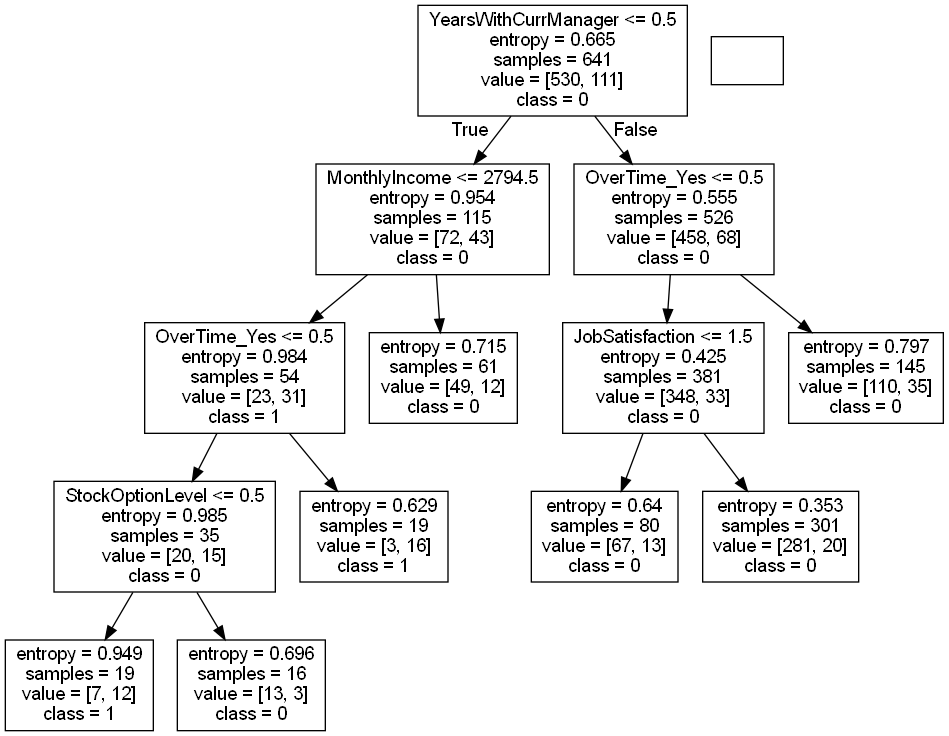

In [83]:
labels = X_train.columns
dot_data = tree.export_graphviz(dt_model, feature_names = labels, class_names = ["0","1"])  

graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())

In [84]:
print('Classification Report for train set: \n', get_train_report(dt_model))

Classification Report for train set: 
               precision    recall  f1-score   support

           0       0.86      0.98      0.92       530
           1       0.74      0.25      0.38       111

    accuracy                           0.85       641
   macro avg       0.80      0.62      0.65       641
weighted avg       0.84      0.85      0.82       641



In [85]:
print('Classification Report for test set: \n', get_test_report(dt_model))

Classification Report for test set: 
               precision    recall  f1-score   support

           0       0.86      0.97      0.92       233
           1       0.54      0.16      0.25        43

    accuracy                           0.85       276
   macro avg       0.70      0.57      0.58       276
weighted avg       0.81      0.85      0.81       276



In [86]:
dt_model = DecisionTreeClassifier(criterion = 'gini',
                                  max_depth = 5,
                                  min_samples_split = 4,
                                  max_leaf_nodes = 6,
                                  random_state =10)
decision_tree = dt_model.fit(X_train, y_train)

train_report = get_train_report(decision_tree)
print('Train data:\n', train_report)

test_report = get_test_report(decision_tree)
print('Test data:\n', test_report)

Train data:
               precision    recall  f1-score   support

           0       0.88      0.96      0.92       530
           1       0.66      0.39      0.49       111

    accuracy                           0.86       641
   macro avg       0.77      0.67      0.70       641
weighted avg       0.84      0.86      0.84       641

Test data:
               precision    recall  f1-score   support

           0       0.89      0.96      0.92       233
           1       0.62      0.35      0.45        43

    accuracy                           0.87       276
   macro avg       0.76      0.66      0.69       276
weighted avg       0.85      0.87      0.85       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Accuracy of train has  been increased by 1% whereas test set accuracy has increased by 2% but high accuracy is likely due to model correctly predicting the majority class.

Precision for class 1 is 0.66 on train and 0.62 on test set. This indicates that when the model predicts attrition, it is correct 62% to 66% time.

Recall for class 0 is significantly high but for class 1 it is only 0.39 in train and 0.35 in test which suggest that the model is missing a significant number of attrition cases.

The decision tree is performing well on majority class but poorly on minority class.


In [35]:
def plot_confusion_matrix(model):
    y_pred = model.predict(X_test)
    
    cm = confusion_matrix(y_test, y_pred)

    conf_matrix = pd.DataFrame(data = cm,columns = ['Predicted:0','Predicted:1'], index = ['Actual:0','Actual:1'])

    sns.heatmap(conf_matrix, annot = True, fmt = 'd', cmap = ListedColormap(['lightskyblue']), cbar = False, 
                linewidths = 0.1, annot_kws = {'size':25})

    plt.xticks(fontsize = 20)

    plt.yticks(fontsize = 20)

    plt.show()

In [36]:
def plot_roc(model):
    y_pred_prob = model.predict_proba(X_test)[:,1]

    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

    plt.plot(fpr, tpr)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])

    plt.plot([0, 1], [0, 1],'r--')

    plt.title('ROC curve for Admission Prediction Classifier', fontsize = 15)
    plt.xlabel('False positive rate (1-Specificity)', fontsize = 15)
    plt.ylabel('True positive rate (Sensitivity)', fontsize = 15)

    plt.text(x = 0.82, y = 0.3, s = ('AUC Score:',round(roc_auc_score(y_test, y_pred_prob),4)))

    plt.grid(True)

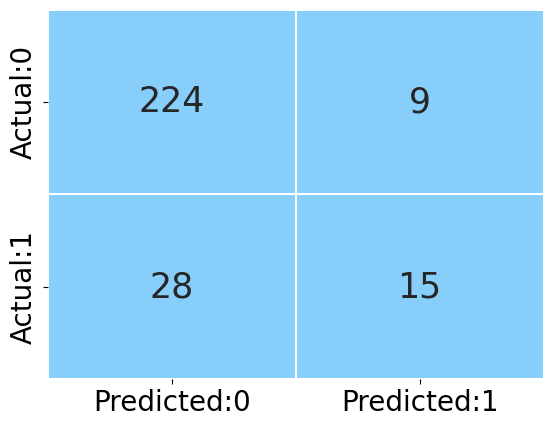

In [102]:
plot_confusion_matrix(dt_model)

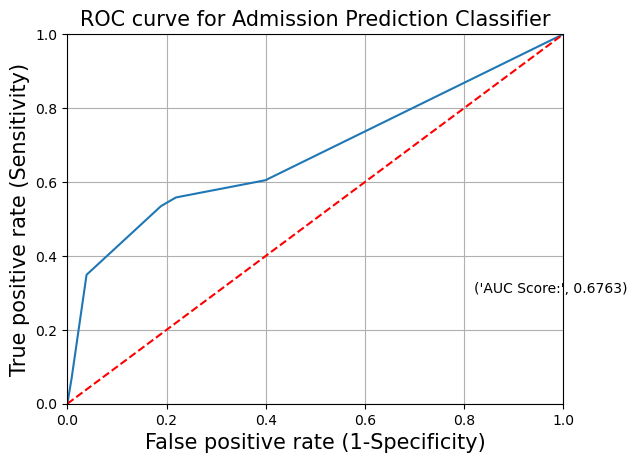

In [105]:
plot_roc(dt_model)

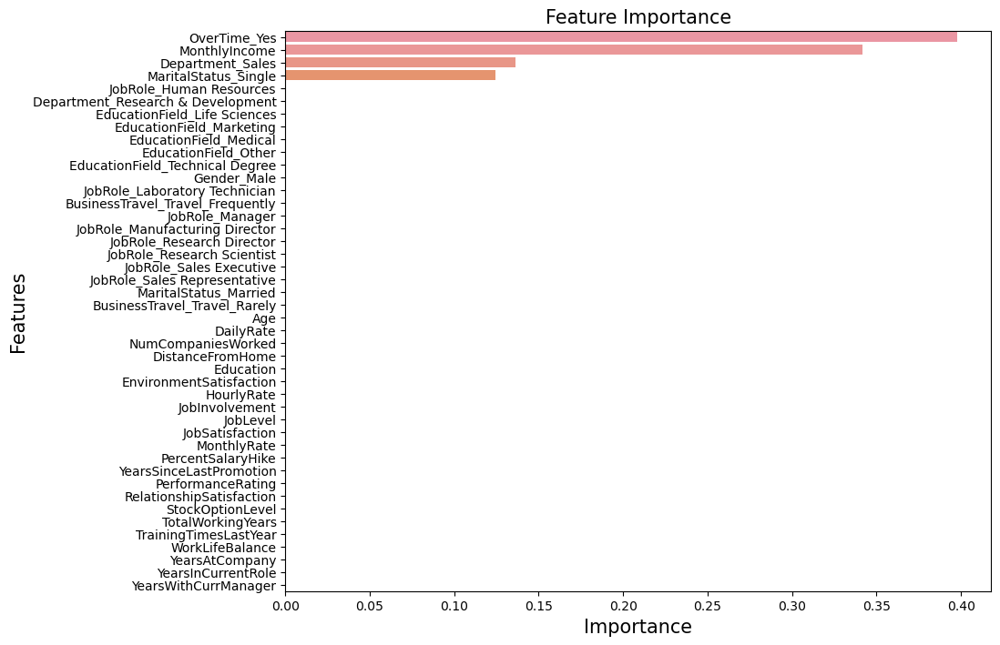

In [107]:
plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': dt_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features
sns.barplot(x = 'Importance', y = 'Features', data = important_features)

plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)
plt.show()

In [108]:
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': dt_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features

,Features,Importance
43,OverTime_Yes,0.397953
9,MonthlyIncome,0.341487
26,Department_Sales,0.136176
42,MaritalStatus_Single,0.124385
33,JobRole_Human Resources,0.000000
25,Department_Research & Development,0.000000
27,EducationField_Life Sciences,0.000000
28,EducationField_Marketing,0.000000
29,EducationField_Medical,0.000000
30,EducationField_Other,0.000000


<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

According to Decision tree model, Overtime_Yes, MonthlyIncome, Department_Sales and MaritalStatus_Single are most important factors in predicting the attrition rate.

### Random forest for classification

In [109]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)

rf_model = rf_classification.fit(X_train, y_train)

**Performance measures on the train set**

In [110]:
train_report = get_train_report(rf_model)
print(train_report) 

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       530
           1       1.00      0.88      0.94       111

    accuracy                           0.98       641
   macro avg       0.99      0.94      0.96       641
weighted avg       0.98      0.98      0.98       641



**Performance measures on test set**

In [111]:
test_report = get_test_report(rf_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.87      0.97      0.91       233
           1       0.53      0.21      0.30        43

    accuracy                           0.85       276
   macro avg       0.70      0.59      0.61       276
weighted avg       0.82      0.85      0.82       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Similar to Decision tree model everything went up to create pure node which gave almost 100% accuracy everywhere. Difference between accuracy of test and train is 13% which is a huge gap thus, we’ll try to tune our parameters to reduce overfitting.

### Tune the Hyperparameters using GridSearchCV (Random Forest)

In [112]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators':[10, 30, 50, 70, 90] ,
                     'max_depth': [10, 15, 20],
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': [2, 5, 8, 11],
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]
random_forest_classification = RandomForestClassifier(random_state = 10)

rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)
rf_grid_model = rf_grid.fit(X_train, y_train)
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': 11, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 30} 



**Model using the tuned hyperparameters**

In [113]:
rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
                                  n_estimators = rf_grid_model.best_params_.get('n_estimators'),
                                  max_depth = rf_grid_model.best_params_.get('max_depth'),
                                  max_features = rf_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)
rf_model = rf_model.fit(X_train, y_train)
print('Classification Report for train set:\n', get_train_report(rf_model))
print('Classification Report for test set:\n', get_test_report(rf_model))

Classification Report for train set:
               precision    recall  f1-score   support

           0       0.85      1.00      0.92       530
           1       0.94      0.14      0.25       111

    accuracy                           0.85       641
   macro avg       0.89      0.57      0.58       641
weighted avg       0.86      0.85      0.80       641

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.86      0.99      0.92       233
           1       0.62      0.12      0.20        43

    accuracy                           0.85       276
   macro avg       0.74      0.55      0.56       276
weighted avg       0.82      0.85      0.81       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Our Random Forest model seems to be doing better than Decision tree as the gap between the accuracy of train and test set has reduced from 2% to 0% and The training set and test set accuracy values are quite similar (around 0.86), suggesting the model is not overfitting the training data also the vaue of precision has increased significantly 

Precision rate has been increased for both train and test set a little but there’s still a gap of 32% in the train and test precision value. The gap between recall for test and train data has been reduced but the train recall value has dropped down a lot.

### Second Tuning the Hyperparameters

In [114]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators':list(range(5,13)) ,
                     'max_depth': list(range(6,12)),
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': list(range(6,10)),
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]

random_forest_classification = RandomForestClassifier(random_state = 10)
rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)
rf_grid_model = rf_grid.fit(X_train, y_train)
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 7, 'max_features': 'log2', 'max_leaf_nodes': 11, 'min_samples_leaf': 1, 'min_samples_split': 7, 'n_estimators': 5} 



In [115]:
rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
                                  n_estimators = rf_grid_model.best_params_.get('n_estimators'),
                                  max_depth = rf_grid_model.best_params_.get('max_depth'),
                                  max_features = rf_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)
rf_model = rf_model.fit(X_train, y_train)
print('Classification Report for train set:\n', get_train_report(rf_model))
print('Classification Report for test set:\n', get_test_report(rf_model))

Classification Report for train set:
               precision    recall  f1-score   support

           0       0.84      1.00      0.91       530
           1       1.00      0.08      0.15       111

    accuracy                           0.84       641
   macro avg       0.92      0.54      0.53       641
weighted avg       0.87      0.84      0.78       641

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.86      1.00      0.92       233
           1       0.80      0.09      0.17        43

    accuracy                           0.86       276
   macro avg       0.83      0.54      0.54       276
weighted avg       0.85      0.86      0.80       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Accuracy has been increased in test data and the performance metrics on train and test set are quite similar, which suggests that the model is not overfitting.
Gap between precision value of test and train has been reduced tremendously.
Recall for class 0 is very high indicating that it is very good at predicting non- attrition class but for class 1 it’s very low almost 8% which suggest that the model is not identifying attrition cases which might be due to imbalance in the dataset between class 0 and class1.

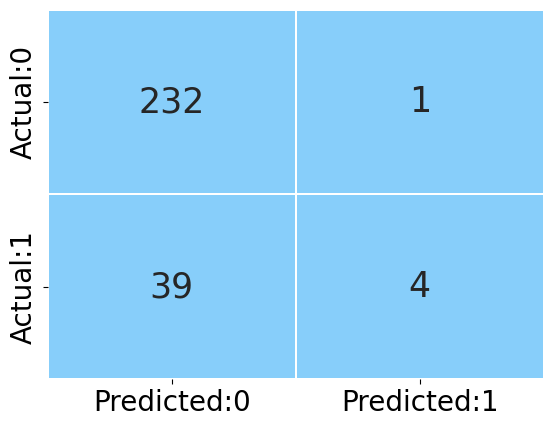

In [116]:
plot_confusion_matrix(rf_model)

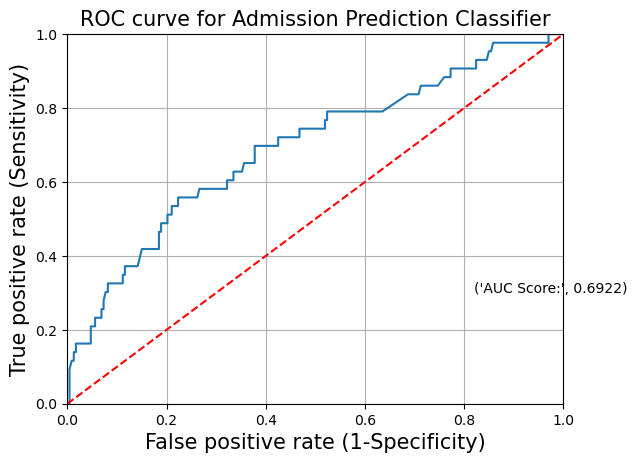

In [117]:
plot_roc(rf_model)

### Identify the important features

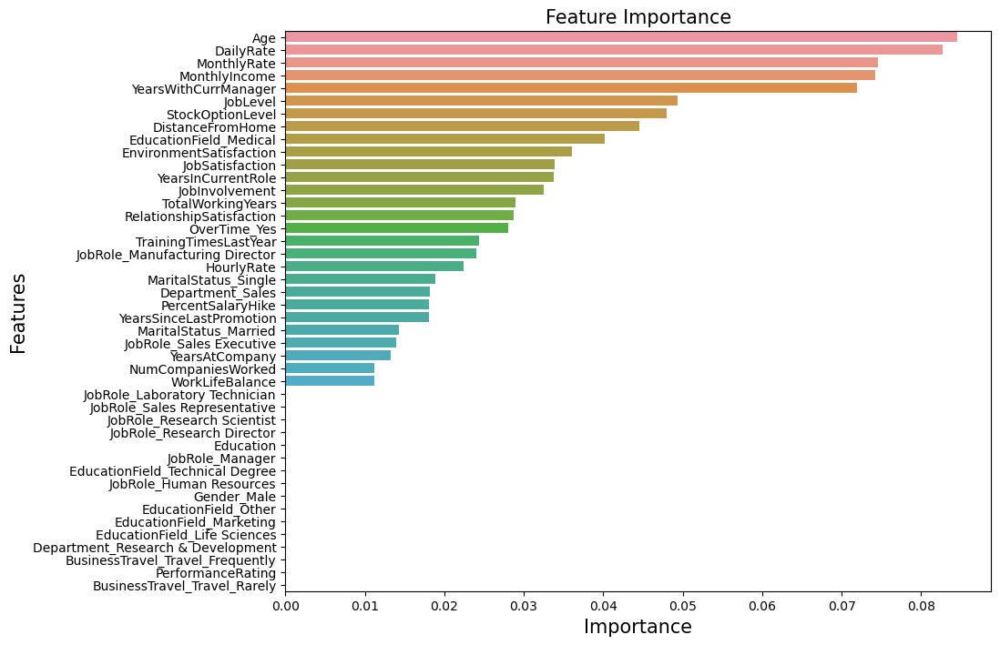

In [118]:
plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': rf_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)
plt.show()

In [119]:
plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': rf_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features

,Features,Importance
0,Age,0.084579
1,DailyRate,0.082731
10,MonthlyRate,0.074555
9,MonthlyIncome,0.074197
22,YearsWithCurrManager,0.071916
7,JobLevel,0.049302
15,StockOptionLevel,0.047949
2,DistanceFromHome,0.044570
29,EducationField_Medical,0.040140
4,EnvironmentSatisfaction,0.036097


<Figure size 1000x800 with 0 Axes>

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

According to above Random Forest Age, Daily Rate, MonthlyIncome, TotalWorkingYears, MaritalStatus_single, YearsAtComapny, DailyRate, JobRole, EnvironmentSatisfaction, PercentSalaryHike, Dapartment_Sales, YearsWithCurrentManager, DistanceFromHome, JobSatisfaction, HourlyRate, OverTime_Yes are some of the important features in predicting the attrition rate for employee in the company. 

### SMOTE 
Applying SMOTE (Synthetic Minority Over-sampling Technique) to balance the dataset

In [24]:
from imblearn.over_sampling import SMOTE

In [37]:
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

In [38]:
rf_classification = RandomForestClassifier(n_estimators = 10, random_state = 10)
rf_model = rf_classification.fit(X_train_res, y_train_res)

In [39]:
train_report = get_train_report(rf_model)
print(train_report) 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99       530
           1       0.99      0.95      0.97       111

    accuracy                           0.99       641
   macro avg       0.99      0.98      0.98       641
weighted avg       0.99      0.99      0.99       641



In [40]:
test_report = get_test_report(rf_model)
print(test_report) 

              precision    recall  f1-score   support

           0       0.89      0.90      0.90       233
           1       0.44      0.42      0.43        43

    accuracy                           0.83       276
   macro avg       0.67      0.66      0.66       276
weighted avg       0.82      0.83      0.82       276



In [41]:
tuned_paramaters = [{'criterion': ['entropy', 'gini'],
                     'n_estimators':list(range(5,13)) ,
                     'max_depth': list(range(6,12)),
                     'max_features': ['sqrt', 'log2'],
                     'min_samples_split': list(range(6,10)),
                     'min_samples_leaf': [1, 5, 9],
                     'max_leaf_nodes': [2, 5, 8, 11]}]

random_forest_classification = RandomForestClassifier(random_state = 10)
rf_grid = GridSearchCV(estimator = random_forest_classification, 
                       param_grid = tuned_paramaters, 
                       cv = 5)
rf_grid_model = rf_grid.fit(X_train_res, y_train_res)
print('Best parameters for random forest classifier: ', rf_grid_model.best_params_, '\n')

Best parameters for random forest classifier:  {'criterion': 'entropy', 'max_depth': 6, 'max_features': 'sqrt', 'max_leaf_nodes': 11, 'min_samples_leaf': 5, 'min_samples_split': 6, 'n_estimators': 9} 



In [42]:
rf_model = RandomForestClassifier(criterion = rf_grid_model.best_params_.get('criterion'), 
                                  n_estimators = rf_grid_model.best_params_.get('n_estimators'),
                                  max_depth = rf_grid_model.best_params_.get('max_depth'),
                                  max_features = rf_grid_model.best_params_.get('max_features'),
                                  max_leaf_nodes = rf_grid_model.best_params_.get('max_leaf_nodes'),
                                  min_samples_leaf = rf_grid_model.best_params_.get('min_samples_leaf'),
                                  min_samples_split = rf_grid_model.best_params_.get('min_samples_split'),
                                  random_state = 10)
rf_model = rf_model.fit(X_train_res, y_train_res)
print('Classification Report for train set:\n', get_train_report(rf_model))
print('Classification Report for test set:\n', get_test_report(rf_model))

Classification Report for train set:
               precision    recall  f1-score   support

           0       0.92      0.86      0.89       530
           1       0.48      0.63      0.55       111

    accuracy                           0.82       641
   macro avg       0.70      0.74      0.72       641
weighted avg       0.84      0.82      0.83       641

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.90      0.83      0.86       233
           1       0.35      0.49      0.41        43

    accuracy                           0.78       276
   macro avg       0.62      0.66      0.64       276
weighted avg       0.81      0.78      0.79       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Overall accuracy slightly decreased from 0.85 to 0.82 on train and 0.87 to 0.78 on test. This is expected as the accuracy measure is now less biased towards majority class(class 0).

Recall for class 1 has improved significantly both on the training set(from 0.08 to 0.63) and test set(from 0.09 to 0.49) .this indicate that model is now better at identifying attrition cases after applying SMOTE

Precision for class 1 has decreased on both train and test, this suggest that while the model is finding more true positive, it is also generating more false positive

Macro averages for precision, recall, and F-1 score have become more balanced on both train and test. This indicate more balanced performance across both classes.

Applying SMOTE have made the model more sensitive to the minority class, which is crucial for addressing the issue of class imbalance in attrition prediction.


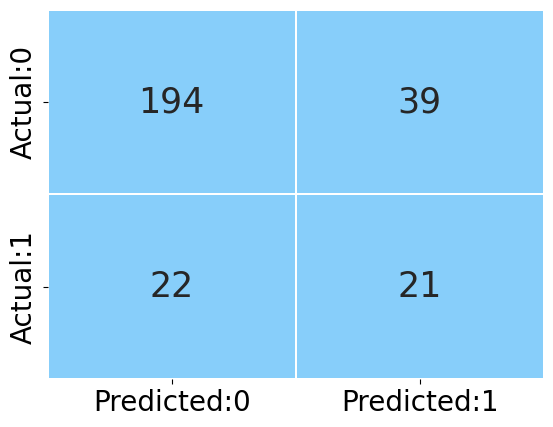

In [43]:
plot_confusion_matrix(rf_model)

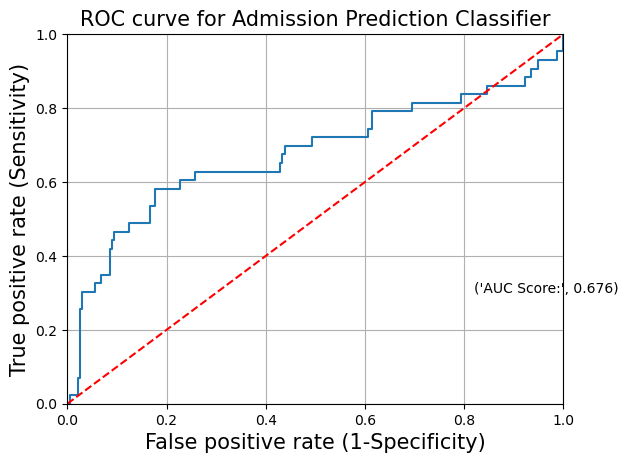

In [44]:
plot_roc(rf_model)

### Important Features

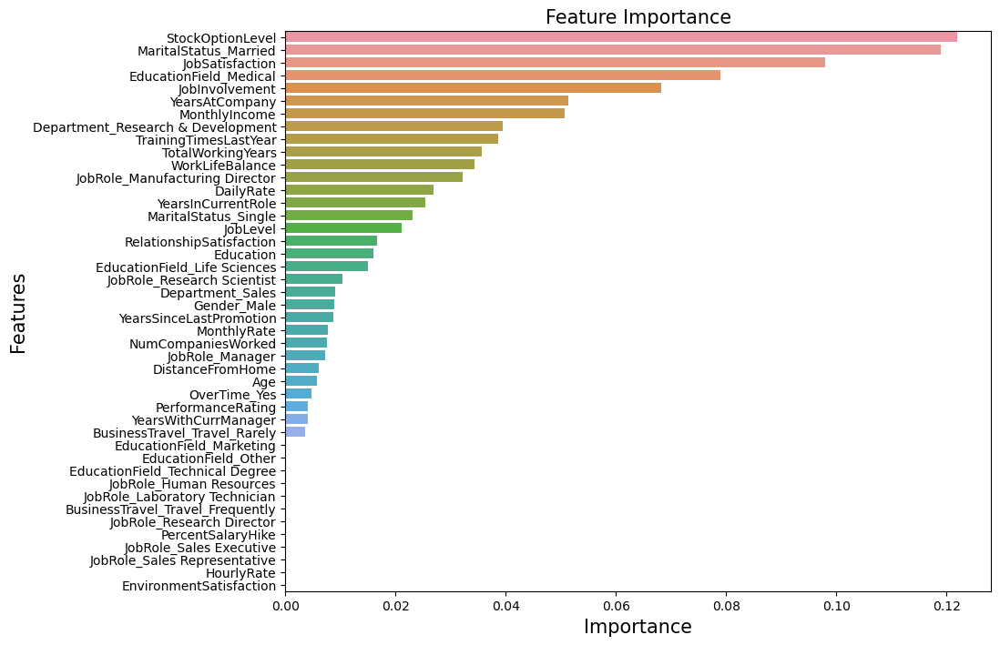

In [45]:
plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train_res.columns, 
                                   'Importance': rf_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

plt.show()

In [46]:
plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train_res.columns, 
                                   'Importance': rf_model.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)

important_features

,Features,Importance
15,StockOptionLevel,0.122009
41,MaritalStatus_Married,0.118999
8,JobSatisfaction,0.098004
29,EducationField_Medical,0.078915
6,JobInvolvement,0.068234
19,YearsAtCompany,0.051410
9,MonthlyIncome,0.050695
25,Department_Research & Development,0.039389
17,TrainingTimesLastYear,0.038631
16,TotalWorkingYears,0.035603


<Figure size 1000x800 with 0 Axes>

<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

Marital Status_Married: Married employees might have higher job satisfaction or stability, leading to a lower likelihood of leaving.

MonthlyIncome: Higher income can incentivize employees to stay, especially if they perceive better opportunities or compensation elsewhere.

StockOptionLevel: Access to stock options can signal investment in the company's future and potentially reduce attrition, particularly for high-performing employees with more options.

EducationField_Medical/Life Sciences: Employees in these fields might have more specialized skills or knowledge, making them more valuable and potentially less likely to find comparable opportunities elsewhere.

JobSatisfaction: Employees who are happy and fulfilled in their roles are less likely to leave.

JobInvolvement: Employees who are highly involved in their work and take ownership might be more committed and less likely to attrite.

YearsInCurrentRole: Employees who have been in their current role for a longer period might have gained experience, built relationships, or have less incentive to leave due to familiarity.

### Ada Boost

In [47]:
from sklearn.ensemble import AdaBoostClassifier

In [48]:
ab_clf=AdaBoostClassifier(random_state=43)
ab_clf.fit(X_train,y_train)

print('Classification Report for train set:\n', get_train_report(ab_clf))
print('Classification Report for test set:\n', get_test_report(ab_clf))


Classification Report for train set:
               precision    recall  f1-score   support

           0       0.92      0.98      0.95       530
           1       0.89      0.59      0.71       111

    accuracy                           0.92       641
   macro avg       0.91      0.79      0.83       641
weighted avg       0.92      0.92      0.91       641

Classification Report for test set:
               precision    recall  f1-score   support

           0       0.90      0.94      0.92       233
           1       0.57      0.47      0.51        43

    accuracy                           0.86       276
   macro avg       0.74      0.70      0.72       276
weighted avg       0.85      0.86      0.86       276



<div style="border-radius:10px; padding: 15px; background-color: #d1d1ed; font-size:120%; text-align:left">

- Accuracy:
AdaBoost has a higher accuracy on both the training set (0.92) and test set (0.86) compared to the SMOTE Random Forest model (training: 0.82, test: 0.78).

- Precision and Recall:
     - For Class 0, both models perform well, but AdaBoost has a higher recall on both the training and test sets.
     - For Class 1, AdaBoost has a significantly higher precision and comparable recall on the training set compared to the SMOTE Random Forest. However, on the test set, AdaBoost still performs better in terms of precision (0.57 vs. 0.35) but has a slightly lower recall (0.47 vs. 0.49).

- F1-Score:
AdaBoost has higher F1-scores for both classes on the training set. On the test set, AdaBoost also shows a better F1-score for Class 1 compared to the SMOTE Random Forest model.

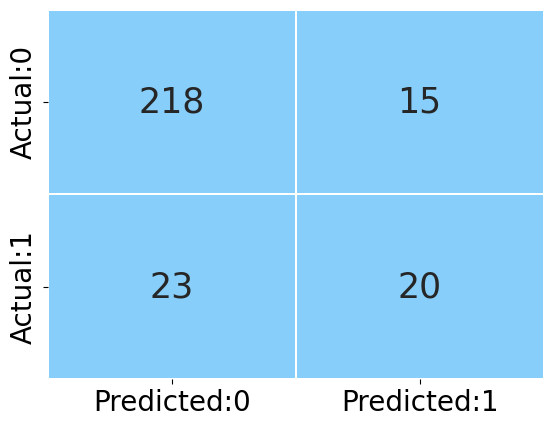

In [49]:
plot_confusion_matrix(ab_clf)

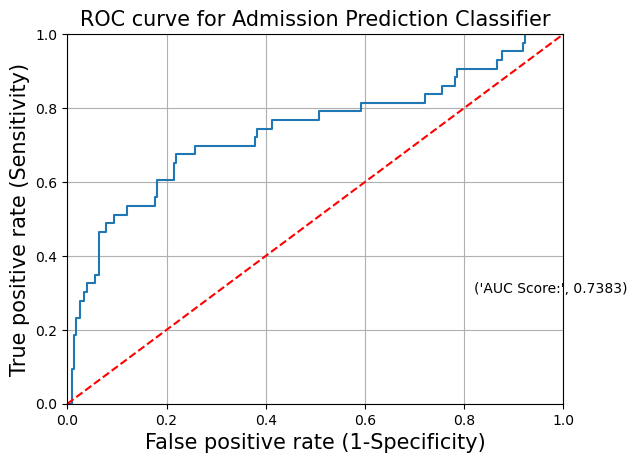

In [50]:
plot_roc(ab_clf)

- AUC Score (0.7383):
The Area Under the Curve (AUC) score is 0.7383, indicating a good but not excellent model performance.
An AUC of 0.5 represents a model that performs no better than random chance, while an AUC of 1.0 represents a perfect model. Thus, an AUC of 0.7383 suggests that the AdaBoost model has a reasonable ability to distinguish between the positive and negative classes.

- ROC Curve Shape:
The curve rises quickly towards the upper left corner, indicating good performance in the initial range of thresholds.
The steeper the curve towards the top-left corner, the better the model is at distinguishing between positive and negative classes.
The curve then flattens out, suggesting that as we decrease the threshold further, there are diminishing returns in terms of improving true positive rate relative to the increase in false positive rate.

- Conclusion
The ROC curve and the AUC score of 0.7383 indicate that the AdaBoost model is fairly effective at distinguishing between the classes in the admission prediction task.

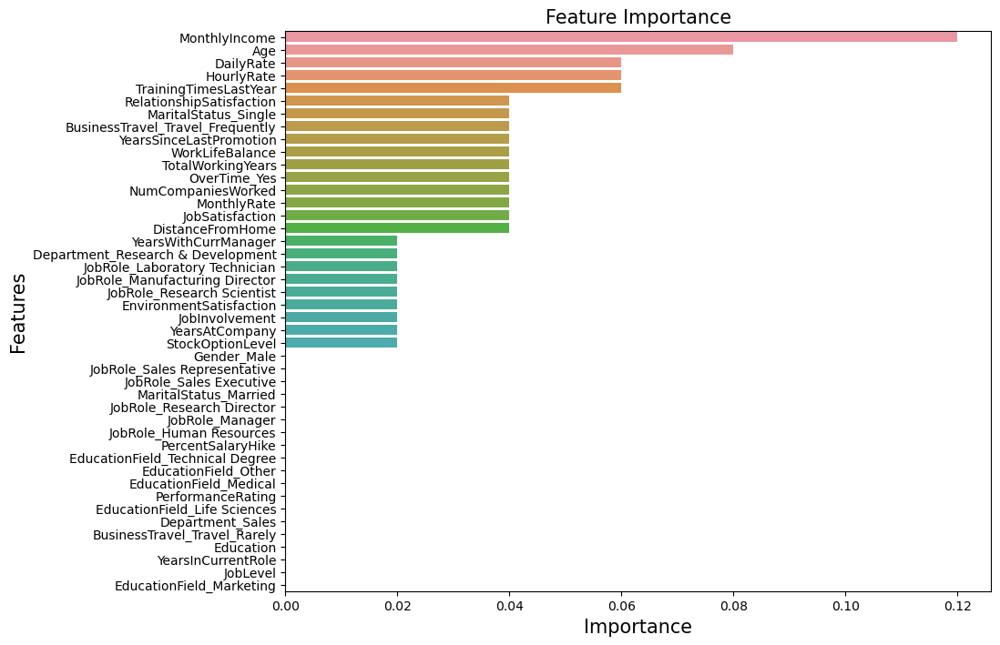

                             Features  Importance
9                       MonthlyIncome    0.120000
0                                 Age    0.080000
1                           DailyRate    0.060000
5                          HourlyRate    0.060000
17              TrainingTimesLastYear    0.060000
14           RelationshipSatisfaction    0.040000
42               MaritalStatus_Single    0.040000
23   BusinessTravel_Travel_Frequently    0.040000
21            YearsSinceLastPromotion    0.040000
18                    WorkLifeBalance    0.040000
16                  TotalWorkingYears    0.040000
43                       OverTime_Yes    0.040000
11                 NumCompaniesWorked    0.040000
10                        MonthlyRate    0.040000
8                     JobSatisfaction    0.040000
2                    DistanceFromHome    0.040000
22               YearsWithCurrManager    0.020000
25  Department_Research & Development    0.020000
34      JobRole_Laboratory Technician    0.020000


In [62]:
ab_clf=AdaBoostClassifier(random_state=43)
ab_clf.fit(X_train, y_train)

plt.figure(figsize=(10, 8))
important_features = pd.DataFrame({'Features': X_train.columns, 
                                   'Importance': ab_clf.feature_importances_})
important_features = important_features.sort_values('Importance', ascending = False)
sns.barplot(x = 'Importance', y = 'Features', data = important_features)
plt.title('Feature Importance', fontsize = 15)
plt.xlabel('Importance', fontsize = 15)
plt.ylabel('Features', fontsize = 15)

plt.show()

print(important_features)

**High Importance Features:**
- MonthlyIncome (0.120): The most important feature, indicating that income significantly impacts the target variable.
- Age (0.080): Age is also a significant predictor, likely correlated with experience and other job-related factors.
- DailyRate, HourlyRate, TrainingTimesLastYear (each 0.060): These features are important and might indicate job satisfaction or company investment in employee development.

**Moderate Importance Features:**
- Features such as RelationshipSatisfaction, MaritalStatus_Single, BusinessTravel_Travel_Frequently, etc., all have an importance of 0.040, indicating they moderately impact the prediction.

**Low Importance Features:**
- Features like YearsWithCurrManager, Department_Research & Development, JobRole_Laboratory Technician, etc., with an importance of 0.020, suggest a smaller impact on the target variable.

### Conclusion after Ada Boost Model- 
AdaBoost Model shows better performance compared to the Random Forest model, with higher accuracy and F1-scores on both training and test sets.
The ROC curve for the AdaBoost model indicates a good level of performance with an AUC score of 0.7383.
AdaBoost also provided meaningful insights into feature importance, highlighting key features like MonthlyIncome and Age as significant predictors.

### Cross Validation

In [51]:
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.metrics import classification_report, make_scorer

In [55]:
ab_clf=AdaBoostClassifier(random_state=43)
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision_weighted',
    'recall': 'recall_weighted',
    'f1': 'f1_weighted'
}
cv_results = cross_validate(ab_clf, X_train_res, y_train_res, cv=5, scoring=scoring)
print("Cross-validation accuracy: ", np.mean(cv_results['test_accuracy']))
print("Cross-validation precision: ", np.mean(cv_results['test_precision']))
print("Cross-validation recall: ", np.mean(cv_results['test_recall']))
print("Cross-validation F1-score: ", np.mean(cv_results['test_f1']))

Cross-validation accuracy:  0.8424528301886793
Cross-validation precision:  0.8533390581958532
Cross-validation recall:  0.8424528301886793
Cross-validation F1-score:  0.8329987014640332


**Accuracy (0.8425):**
The cross-validation accuracy indicates that the model correctly predicts the outcome approximately 84.25% of the time. This high accuracy suggests that the AdaBoost model generalizes well to unseen data.

**Precision (0.8533):**
Precision measures the proportion of true positive predictions among all positive predictions. A precision of 85.33% implies that when the model predicts a positive class, it is correct 85.33% of the time. This is crucial in contexts where false positives are costly.

**Recall (0.8425):**
Recall measures the proportion of true positive predictions among all actual positives. A recall of 84.25% indicates that the model successfully identifies 84.25% of the actual positive cases. This is important in scenarios where missing positive cases (false negatives) is costly.

**F1-Score (0.8330):**
The F1-score is the harmonic mean of precision and recall. An F1-score of 83.30% reflects a good balance between precision and recall. This is particularly useful when the classes are imbalanced, ensuring that the model performs well in identifying both positive and negative classes, which is advantageous in many real-world scenarios where both false positives and false negatives need to be minimized..

### Conclusion:
Given the high and consistent cross-validation metrics, the AdaBoost model is robust and well-suited for the classification task at hand. It shows strong generalization capabilities and reliable performance in both precision and recall, making it an excellent choice for deployment.